In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
comment = pd.read_csv('C:/Users/ktnvaish/Data_Analysis/youtube cmnts/GBcomments.csv', error_bad_lines = False)

b'Skipping line 113225: expected 4 fields, saw 5\n'
b'Skipping line 158379: expected 4 fields, saw 7\nSkipping line 241590: expected 4 fields, saw 5\nSkipping line 245637: expected 4 fields, saw 7\n'
b'Skipping line 521402: expected 4 fields, saw 5\n'


In [3]:
comment.head()

,video_id,comment_text,likes,replies
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0


In [4]:
!pip install textblob

In [5]:
from textblob import TextBlob

In [6]:
TextBlob("its terrific movie").sentiment.polarity

0.0

In [7]:
comment.isna().sum()
#to check if there are missing values

video_id         0
comment_text    28
likes            0
replies          0
dtype: int64

In [8]:
comment.loc[:,"comment_text"].head()

0    It's more accurate to call it the M+ (1000) be...
1                To be there with a samsung phone\n😂😂😂
2    Thank gosh, a place I can watch it without hav...
3    What happened to the home button on the iPhone...
4    Power is the disease.  Care is the cure.  Keep...
Name: comment_text, dtype: object

In [9]:
comment.dropna(inplace=True)

In [10]:
comment.isna().sum()

video_id        0
comment_text    0
likes           0
replies         0
dtype: int64

In [11]:
polarity = []
for cmnt in comment['comment_text']:
    pol = (TextBlob(cmnt).sentiment.polarity)
    polarity.append(pol)

polarity

[0.45000000000000007,
 0.0,
 0.0,
 0.0,
 1.0,
 0.30000000000000004,
 0.0,
 -0.10000000000000003,
 0.028571428571428564,
 0.5,
 0.5,
 0.0,
 0.30000000000000004,
 0.026562500000000003,
 0.5,
 0.5,
 0.2,
 0.25,
 0.5,
 0.3,
 0.0,
 0.0,
 0.1,
 0.26684220251293417,
 0.0,
 0.37878787878787873,
 1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.5,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.3,
 0.0,
 0.0,
 0.6000000000000001,
 0.0,
 0.7,
 0.0,
 0.0,
 0.0,
 0.0,
 0.7,
 0.4333333333333333,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.1,
 0.0,
 -0.5,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.6,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -0.4,
 -0.2,
 0.0,
 0.0,
 0.0,
 0.0,
 1.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 -0.5,
 0.0,
 0.0,
 -0.4,
 0.0,
 0.6,
 0.0,
 -0.5,
 0.0,
 0.0,
 0.05,
 0.0,
 -0.78125,
 0.0,
 0.04999999999999999,
 0.16666666666666666,
 -0.05,
 -0.125,
 0.0,
 0.26,
 0.25,
 -0.01171875,
 0.0,
 -0.175,
 0.0,
 -0.4,
 0.5,
 0.0,
 0.13636363636363635,
 0.0,
 0.0,
 0.5444444444444444,
 0.25,
 0.0,
 0.13636363636363

In [12]:
comment['polarity'] = polarity

In [13]:
comment.head()

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.45
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.00
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.00
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.00
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.00


In [14]:
positive_com = comment[comment['polarity']==1]

In [15]:
positive_com.head()

,video_id,comment_text,likes,replies,polarity
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.0
26,jt2OHQh0HoQ,The best thing to ever happen to iPhone,0,2,1.0
80,jt2OHQh0HoQ,Apple is always awesome \n\nhttps://youtu.be/r...,0,1,1.0
158,YPVcg45W0z4,das a lot of edditing you have done there ... ...,0,0,1.0
175,YPVcg45W0z4,Welcome to the Scandiworld!,0,0,1.0


In [16]:
!pip install wordcloud

In [17]:
from wordcloud import WordCloud, STOPWORDS

In [18]:
stopwords = set(STOPWORDS)
stopwords

{'a',
 'about',
 'above',
 'after',
 'again',
 'against',
 'all',
 'also',
 'am',
 'an',
 'and',
 'any',
 'are',
 "aren't",
 'as',
 'at',
 'be',
 'because',
 'been',
 'before',
 'being',
 'below',
 'between',
 'both',
 'but',
 'by',
 'can',
 "can't",
 'cannot',
 'com',
 'could',
 "couldn't",
 'did',
 "didn't",
 'do',
 'does',
 "doesn't",
 'doing',
 "don't",
 'down',
 'during',
 'each',
 'else',
 'ever',
 'few',
 'for',
 'from',
 'further',
 'get',
 'had',
 "hadn't",
 'has',
 "hasn't",
 'have',
 "haven't",
 'having',
 'he',
 "he'd",
 "he'll",
 "he's",
 'hence',
 'her',
 'here',
 "here's",
 'hers',
 'herself',
 'him',
 'himself',
 'his',
 'how',
 "how's",
 'however',
 'http',
 'i',
 "i'd",
 "i'll",
 "i'm",
 "i've",
 'if',
 'in',
 'into',
 'is',
 "isn't",
 'it',
 "it's",
 'its',
 'itself',
 'just',
 'k',
 "let's",
 'like',
 'me',
 'more',
 'most',
 "mustn't",
 'my',
 'myself',
 'no',
 'nor',
 'not',
 'of',
 'off',
 'on',
 'once',
 'only',
 'or',
 'other',
 'otherwise',
 'ought',
 'our',
 

In [19]:
positive_com['comment_text'].head(20)

4      Power is the disease.  Care is the cure.  Keep...
26               The best thing to ever happen to iPhone
80     Apple is always awesome \n\nhttps://youtu.be/r...
158    das a lot of edditing you have done there ... ...
175                          Welcome to the Scandiworld!
202    Power is the disease.  Care is the cure.  Keep...
206    WHY DO I KEEP FREAKING LAUGHING EACH TIME I WA...
237    LIKE = MEET CELEBRITY \nSUBSCRIBE = BECOME A B...
243                      the sonic air timer was perfect
283                         no 16 on trending impressive
306                        My daughters name is lacey <3
332    I'm 17 and can proudly say Moon Dreamers was o...
607    if I could subscribe to Dude Perfect a million...
609             You guys should make dude perfect sceets
644    To be a dude perfect member it is so awesome ....
649    Dude Perfect should do a collab with the slo m...
658                    the cody trust stort is excellent
676                            

In [20]:
type(positive_com['comment_text'])

pandas.core.series.Series

In [21]:
joined_pos_com = " ".join(positive_com['comment_text'])

In [22]:
joined_pos_com

"Power is the disease.\xa0 Care is the cure.\xa0 Keep caring for yourself and others as best as you can.\xa0 This is life. The best thing to ever happen to iPhone Apple is always awesome \\n\\nhttps://youtu.be/rftzm6X1yP4 das a lot of edditing you have done there ... I like it :D Welcome to the Scandiworld! Power is the disease.\xa0 Care is the cure.\xa0 Keep caring for yourself and others as best as you can.\xa0 This is life. WHY DO I KEEP FREAKING LAUGHING EACH TIME I WATCH IT AGAIN ! even though I know how it will end. omg the best 😂 LIKE = MEET CELEBRITY \\nSUBSCRIBE = BECOME A BILLIONAIRE\\nSCROLL UP/DOWN = DEATH FOR YOU AND EVERYONE YOU LOVE!!!!!!!!!!!!!!!!!!!!!!!!!!!!! the sonic air timer was perfect no 16 on trending impressive My daughters name is lacey <3 I'm 17 and can proudly say Moon Dreamers was one of my favourite shows! if I could subscribe to Dude Perfect a million times I would You guys should make dude perfect sceets To be a dude perfect member it is so awesome .... 

In [23]:
pos_cloud = WordCloud(width = 1000, height = 1000, stopwords = stopwords).generate(joined_pos_com)

In [24]:
pos_cloud

(-0.5, 999.5, 999.5, -0.5)

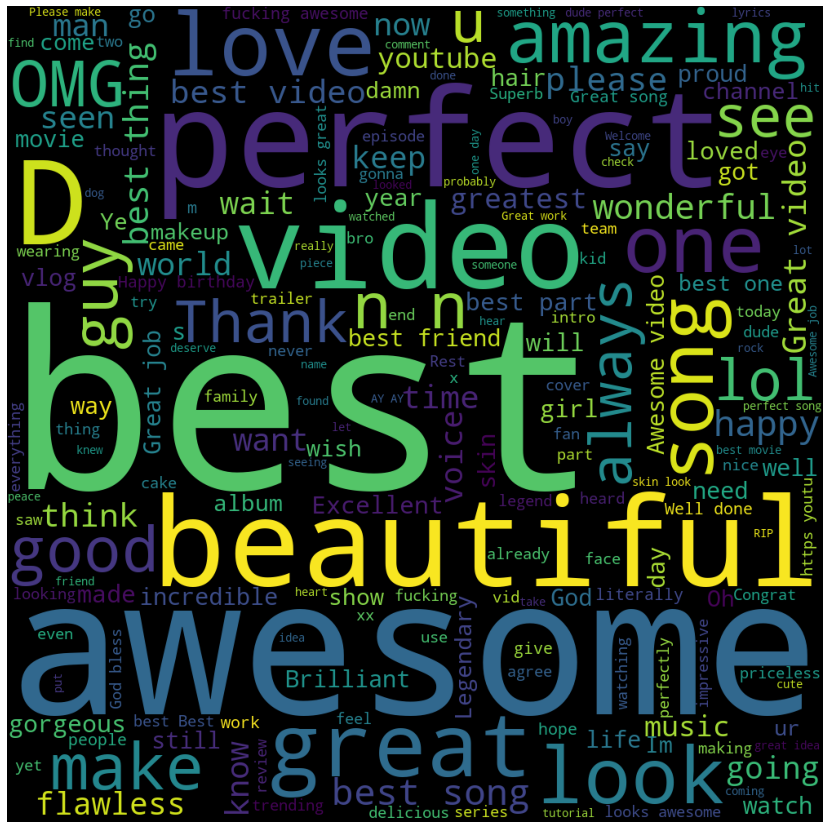

In [25]:
plt.figure(figsize=(25,15))
plt.imshow(pos_cloud)
plt.axis("off")

In [26]:
negative_com = comment[comment['polarity']==-1]
joined_neg_com = " ".join(negative_com['comment_text']) 

In [27]:
neg_cloud = WordCloud(width = 1000, height = 1000, stopwords = stopwords).generate(joined_neg_com)

(-0.5, 999.5, 999.5, -0.5)

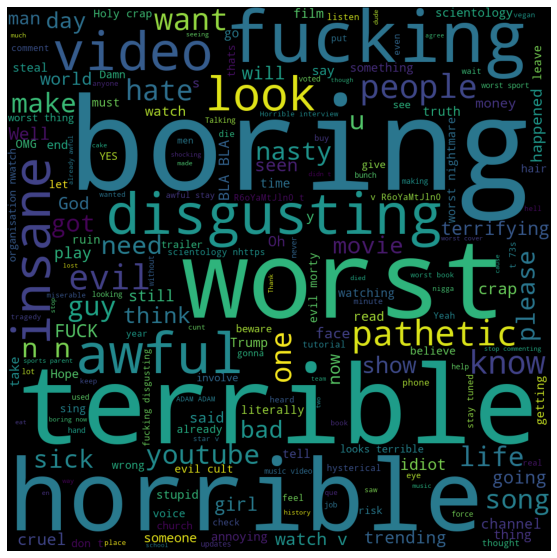

In [28]:
plt.figure(figsize=(20, 10))
plt.imshow(neg_cloud)
plt.axis('off')

# new ANALYSIS

In [29]:
videos = pd.read_csv('C:\\Users\\ktnvaish\\Data_Analysis\\youtube cmnts/USvideos.csv', error_bad_lines = False)

b'Skipping line 2401: expected 11 fields, saw 21\nSkipping line 2800: expected 11 fields, saw 21\nSkipping line 5297: expected 11 fields, saw 12\nSkipping line 5299: expected 11 fields, saw 12\nSkipping line 5300: expected 11 fields, saw 12\nSkipping line 5301: expected 11 fields, saw 12\n'


In [30]:
videos.head(10)

,video_id,title,channel_title,category_id,tags,views,likes,dislikes,comment_total,thumbnail_link,date
0,XpVt6Z1Gjjo,1 YEAR OF VLOGGING -- HOW LOGAN PAUL CHANGED Y...,Logan Paul Vlogs,24,logan paul vlog|logan paul|logan|paul|olympics...,4394029,320053,5931,46245,https://i.ytimg.com/vi/XpVt6Z1Gjjo/default.jpg,13.09
1,K4wEI5zhHB0,iPhone X — Introducing iPhone X — Apple,Apple,28,Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lig...,7860119,185853,26679,0,https://i.ytimg.com/vi/K4wEI5zhHB0/default.jpg,13.09
2,cLdxuaxaQwc,My Response,PewDiePie,22,[none],5845909,576597,39774,170708,https://i.ytimg.com/vi/cLdxuaxaQwc/default.jpg,13.09
3,WYYvHb03Eog,Apple iPhone X first look,The Verge,28,apple iphone x hands on|Apple iPhone X|iPhone ...,2642103,24975,4542,12829,https://i.ytimg.com/vi/WYYvHb03Eog/default.jpg,13.09
4,sjlHnJvXdQs,iPhone X (parody),jacksfilms,23,jacksfilms|parody|parodies|iphone|iphone x|iph...,1168130,96666,568,6666,https://i.ytimg.com/vi/sjlHnJvXdQs/default.jpg,13.09
5,cMKX2tE5Luk,The Disaster Artist | Official Trailer HD | A24,A24,1,a24|a24 films|a24 trailers|independent films|t...,1311445,34507,544,3040,https://i.ytimg.com/vi/cMKX2tE5Luk/default.jpg,13.09
6,8wNr-NQImFg,"The Check In: HUD, Ben Carson and Hurricanes",Late Night with Seth Meyers,23,Late night|Seth Meyers|check in|hud|Ben Carson...,666169,9985,297,1071,https://i.ytimg.com/vi/8wNr-NQImFg/default.jpg,13.09
7,_HTXMhKWqnA,iPhone X Impressions & Hands On!,Marques Brownlee,28,iPhone X|iphone x|iphone 10|iPhone X impressio...,1728614,74062,2180,15297,https://i.ytimg.com/vi/_HTXMhKWqnA/default.jpg,13.09
8,_ANP3HR1jsM,ATTACKED BY A POLICE DOG!!,RomanAtwoodVlogs,22,Roman Atwood|Roman|Atwood|roman atwood vlogs|f...,1338533,69687,678,5643,https://i.ytimg.com/vi/_ANP3HR1jsM/default.jpg,13.09
9,zgLtEob6X-Q,Honest Trailers - The Mummy (2017),Screen Junkies,1,screenjunkies|screen junkies|screenjunkies new...,1056891,29943,878,4046,https://i.ytimg.com/vi/zgLtEob6X-Q/default.jpg,13.09


In [31]:
videos['likes'].head()

0    320053
1    185853
2    576597
3     24975
4     96666
Name: likes, dtype: int64

In [32]:
videos.isna().sum()
print(type(videos['tags']))

<class 'pandas.core.series.Series'>


In [33]:
tags_compl = " ".join(videos['tags'])

In [34]:
tags_compl

"logan paul vlog|logan paul|logan|paul|olympics|logan paul youtube|vlog|daily|comedy|hollywood|parrot|maverick|bird|maverick clothes|diamond play button|logan paul diamond play button|10M subscribers|logan paul 1 year vlogging|1 year vlog|dwarf mamba play button|logan paul history|youtube history|10M|10M plaque|youtube button|diamond button|logang|logang 4 life Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lighting|A11 Bionic|augmented reality|emoji|animoji|Face ID|Apple Pay|camera|smartphone [none] apple iphone x hands on|Apple iPhone X|iPhone X|apple iphone x first look|iPhone X first look|apple iphone x event 2017|apple iphone x event|iPhone X price|iPhone X specs|iPhone X design|iPhone X camera|iPhone X home button|iPhone X wireless charging|iPhone X waterproof|iPhone X release date|iphone 2017|apple|iphone|ios 11|the verge|verge jacksfilms|parody|parodies|iphone|iphone x|iphone 8|apple|emoji a24|a24 films|a24 trailers|independent films|trailer|HD|official|movie|film|a24 movies|oscar 

In [35]:
import re

In [36]:
tags_compl = re.sub('[^a-zA-Z]', ' ', tags_compl)

In [37]:
tags_compl

'logan paul vlog logan paul logan paul olympics logan paul youtube vlog daily comedy hollywood parrot maverick bird maverick clothes diamond play button logan paul diamond play button   M subscribers logan paul   year vlogging   year vlog dwarf mamba play button logan paul history youtube history   M   M plaque youtube button diamond button logang logang   life Apple iPhone    iPhone Ten iPhone Portrait Lighting A   Bionic augmented reality emoji animoji Face ID Apple Pay camera smartphone  none  apple iphone x hands on Apple iPhone X iPhone X apple iphone x first look iPhone X first look apple iphone x event      apple iphone x event iPhone X price iPhone X specs iPhone X design iPhone X camera iPhone X home button iPhone X wireless charging iPhone X waterproof iPhone X release date iphone      apple iphone ios    the verge verge jacksfilms parody parodies iphone iphone x iphone   apple emoji a   a   films a   trailers independent films trailer HD official movie film a   movies oscar 

In [38]:
tags_compl = re.sub(" +", " ", tags_compl)

In [39]:
tags_compl

'logan paul vlog logan paul logan paul olympics logan paul youtube vlog daily comedy hollywood parrot maverick bird maverick clothes diamond play button logan paul diamond play button M subscribers logan paul year vlogging year vlog dwarf mamba play button logan paul history youtube history M M plaque youtube button diamond button logang logang life Apple iPhone iPhone Ten iPhone Portrait Lighting A Bionic augmented reality emoji animoji Face ID Apple Pay camera smartphone none apple iphone x hands on Apple iPhone X iPhone X apple iphone x first look iPhone X first look apple iphone x event apple iphone x event iPhone X price iPhone X specs iPhone X design iPhone X camera iPhone X home button iPhone X wireless charging iPhone X waterproof iPhone X release date iphone apple iphone ios the verge verge jacksfilms parody parodies iphone iphone x iphone apple emoji a a films a trailers independent films trailer HD official movie film a movies oscar winner academy award winner The Disaster A

In [40]:
wordcloud = WordCloud(width = 2000, height = 1000, stopwords = set(STOPWORDS)).generate(tags_compl)

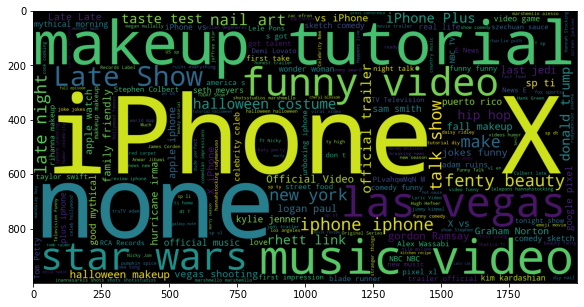

In [41]:
plt.figure(figsize = (15, 5))
plt.imshow(wordcloud)

Text(0.5, 1.0, 'Regreassion for Views vs Likes')

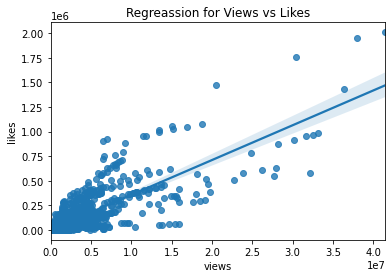

In [42]:
sns.regplot(data = videos, x = 'views', y = 'likes')
plt.title("Regreassion for Views vs Likes")

Text(0.5, 1.0, 'Regreassion for Views vs Dislikes')

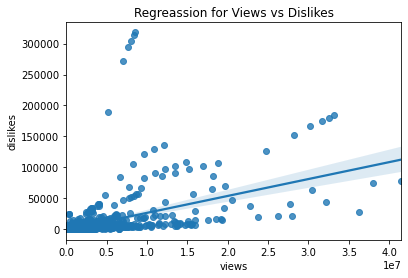

In [43]:
sns.regplot(data = videos, x = 'views', y = 'dislikes')
plt.title("Regreassion for Views vs Dislikes")

Text(0.5, 1.0, 'Regreassion for likes vs dislikes')

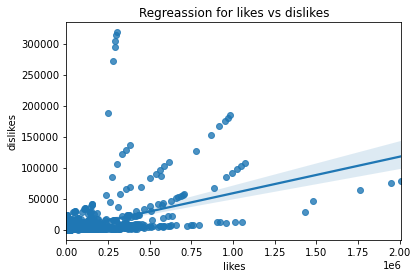

In [44]:
sns.regplot(data = videos, x = 'likes', y = 'dislikes')
plt.title("Regreassion for likes vs dislikes")

In [45]:
df_corr = videos[['views', 'likes', 'dislikes']]

In [46]:
df_corr.corr()

,views,likes,dislikes
views,1.000000,0.832844,0.541955
likes,0.832844,1.000000,0.497439
dislikes,0.541955,0.497439,1.000000


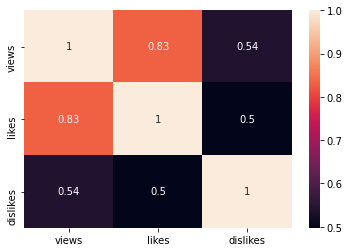

In [47]:
sns.heatmap(df_corr.corr(), annot=True)

# emoji analysis

In [48]:
3+2

5

In [49]:
comment.head()

,video_id,comment_text,likes,replies,polarity
0,jt2OHQh0HoQ,It's more accurate to call it the M+ (1000) be...,0,0,0.45
1,jt2OHQh0HoQ,To be there with a samsung phone\n😂😂😂,1,0,0.00
2,jt2OHQh0HoQ,"Thank gosh, a place I can watch it without hav...",0,0,0.00
3,jt2OHQh0HoQ,What happened to the home button on the iPhone...,0,0,0.00
4,jt2OHQh0HoQ,Power is the disease. Care is the cure. Keep...,0,0,1.00


In [50]:
comm = comment['comment_text']
comm

0         It's more accurate to call it the M+ (1000) be...
1                     To be there with a samsung phone\n😂😂😂
2         Thank gosh, a place I can watch it without hav...
3         What happened to the home button on the iPhone...
4         Power is the disease.  Care is the cure.  Keep...
                                ...                        
718447                              MEME ME MEME ME MEME ME
718448                      Yeah, but does everybody float?
718449                                  That meme me dace 😂
718450                       10:43 Is that Miles Upshur????
718451                                  WA-HA\nWA-HA\nWA-HA
Name: comment_text, Length: 718424, dtype: object

In [51]:
import emoji

In [52]:
emoji.__version__

'1.2.0'

In [53]:
[c for c in comm if c in emoji.UNICODE_EMOJI_ENGLISH]

['🖤',
 '😂',
 '💄',
 '😞',
 '😍',
 '😒',
 '👎🏽',
 '❤',
 '🍺',
 '🌞',
 '💛',
 '😍',
 '💕',
 '💦',
 '👌',
 '🎈',
 '🤴🏻',
 '😻',
 '💄',
 '😕',
 '☺',
 '💗',
 '🇩🇰',
 '👍',
 '🇧🇷',
 '😴',
 '👌🏻',
 '👍',
 '👀',
 '🙏🏽',
 '❤',
 '🆗',
 '😂',
 '🌞',
 '😝',
 '❤',
 '😒',
 '👎🏽',
 '🍺',
 '😂',
 '💛',
 '😍',
 '🎈',
 '☺',
 '❤',
 '💗',
 '💗',
 '🇧🇷',
 '👍',
 '👍',
 '👍',
 '❤',
 '👍',
 '😃',
 '😂',
 '👍',
 '👍',
 '🎢',
 '🆗',
 '🌞',
 '🙄',
 '👍',
 '😍',
 '❤',
 '❤',
 '🍺',
 '😂',
 '😂',
 '💕',
 '💛',
 '👍',
 '💙',
 '😍',
 '😍',
 '❤',
 '👍',
 '👍🏾',
 '😍',
 '❤',
 '😍',
 '✋',
 '😢',
 '😍',
 '😂',
 '😂',
 '👌',
 '🔥',
 '👋',
 '❤',
 '❤',
 '🆗',
 '🔥',
 '❤',
 '👍',
 '💚',
 '♥',
 '👍',
 '🔥',
 '🍺',
 '😂',
 '💕',
 '💛',
 '🎶',
 '👍',
 '💿',
 '😂',
 '🌊',
 '👍🏾',
 '👁',
 '😷',
 '❤',
 '😂',
 '✋',
 '👌🏾',
 '👍',
 '😍',
 '🔥',
 '😢',
 '😂',
 '👍',
 '❤',
 '🐝',
 '👍',
 '😎',
 '💕',
 '🤘🏻',
 '❤',
 '☺',
 '🆗',
 '👌🏽',
 '❤',
 '😱',
 '♥',
 '💑',
 '🎆',
 '💕',
 '🍺',
 '🎈',
 '🎈',
 '😍',
 '❤',
 '❤',
 '💞',
 '🌊',
 '😂',
 '👁',
 '🎈',
 '🎈',
 '🎈',
 '😂',
 '😍',
 '✋',
 '❤',
 '😕',
 '😂',
 '💯',
 '😂',
 '❤',
 '☺',
 '💕',
 '🆗',
 '💑',
 '🍺',
 '♥',
 '💙

In [54]:
print(type(comment['comment_text']))
print(type(comment['comment_text'][0]))
print(comment['comment_text'][0])

<class 'pandas.core.series.Series'>
<class 'str'>
It's more accurate to call it the M+ (1000) because the price is closer than calling it the X (10).


In [55]:
print(type(videos['tags']))
print(type(videos['tags'][0]))

<class 'pandas.core.series.Series'>
<class 'str'>


In [56]:
total_tags = " ".join(videos['tags'])
total_tags

"logan paul vlog|logan paul|logan|paul|olympics|logan paul youtube|vlog|daily|comedy|hollywood|parrot|maverick|bird|maverick clothes|diamond play button|logan paul diamond play button|10M subscribers|logan paul 1 year vlogging|1 year vlog|dwarf mamba play button|logan paul history|youtube history|10M|10M plaque|youtube button|diamond button|logang|logang 4 life Apple|iPhone 10|iPhone Ten|iPhone|Portrait Lighting|A11 Bionic|augmented reality|emoji|animoji|Face ID|Apple Pay|camera|smartphone [none] apple iphone x hands on|Apple iPhone X|iPhone X|apple iphone x first look|iPhone X first look|apple iphone x event 2017|apple iphone x event|iPhone X price|iPhone X specs|iPhone X design|iPhone X camera|iPhone X home button|iPhone X wireless charging|iPhone X waterproof|iPhone X release date|iphone 2017|apple|iphone|ios 11|the verge|verge jacksfilms|parody|parodies|iphone|iphone x|iphone 8|apple|emoji a24|a24 films|a24 trailers|independent films|trailer|HD|official|movie|film|a24 movies|oscar 

In [57]:
print(comment['comment_text'][475])
print(type(comment['comment_text'][975]))

Hazard's 5 Defending tho
<class 'str'>


In [58]:
comment['comment_text'].isna().sum()

0

In [59]:
comment['comment_text'].dropna()

0         It's more accurate to call it the M+ (1000) be...
1                     To be there with a samsung phone\n😂😂😂
2         Thank gosh, a place I can watch it without hav...
3         What happened to the home button on the iPhone...
4         Power is the disease.  Care is the cure.  Keep...
                                ...                        
718447                              MEME ME MEME ME MEME ME
718448                      Yeah, but does everybody float?
718449                                  That meme me dace 😂
718450                       10:43 Is that Miles Upshur????
718451                                  WA-HA\nWA-HA\nWA-HA
Name: comment_text, Length: 718424, dtype: object

In [60]:
len(comment['comment_text'])

718424

In [61]:
str = ''
for c in comment['comment_text']:
    listemoji = [i for i in c if i in emoji.UNICODE_EMOJI_ENGLISH]
    for emo in listemoji:
        str += emo

In [62]:
len(str)

333278

In [75]:
result = {}
for emoji in set(str):
    result[emoji] = str.count(emoji)
type(result)

dict

In [76]:
type(result)

dict

In [77]:
final = {}
for key,value in sorted(result.items(), key = lambda item:item[1], reverse=True):
    final[key] = value
final

{'😂': 43947,
 '❤': 36780,
 '😍': 34856,
 '🔥': 10249,
 '😭': 9098,
 '♥': 7173,
 '💕': 6531,
 '😘': 6334,
 '👍': 5817,
 '😬': 5489,
 '👏': 5357,
 '😊': 4946,
 '💖': 4809,
 '🏻': 4412,
 '💜': 3616,
 '👌': 3534,
 '💗': 3071,
 '💙': 2968,
 '🏼': 2961,
 '🙌': 2734,
 '😁': 2504,
 '🤣': 2374,
 '😱': 2316,
 '💛': 2169,
 '💚': 2138,
 '😢': 2074,
 '😅': 1977,
 '😩': 1924,
 '🙏': 1886,
 '🏽': 1875,
 '💯': 1796,
 '😀': 1788,
 '🤔': 1734,
 '💓': 1579,
 '😄': 1541,
 '☺': 1481,
 '😆': 1423,
 '😎': 1412,
 '💞': 1393,
 '😻': 1363,
 '😃': 1327,
 '✨': 1298,
 '💪': 1289,
 '🏾': 1241,
 '😉': 1153,
 '😙': 1139,
 '🤗': 1128,
 '🖕': 1019,
 '💋': 963,
 '💿': 929,
 '💀': 892,
 '😥': 860,
 '✌': 859,
 '🎶': 855,
 '👑': 853,
 '🎉': 833,
 '🔴': 819,
 '🔵': 803,
 '🖤': 802,
 '😫': 782,
 '🙄': 765,
 '🌹': 750,
 '💘': 739,
 '🎈': 736,
 '🤘': 731,
 '🎃': 715,
 '👎': 712,
 '😜': 684,
 '😔': 662,
 '💔': 652,
 '♀': 650,
 '❣': 647,
 '💩': 638,
 '😏': 636,
 '😋': 634,
 '🍗': 630,
 '😇': 626,
 '🕚': 618,
 '😐': 598,
 '😮': 596,
 '👀': 596,
 '🌟': 587,
 '😚': 583,
 '🙈': 576,
 '😒': 570,
 '💝': 562,
 '

In [78]:
type(final)

dict

## unzipping the list

In [80]:
res_key = [*final.keys()]

In [81]:
res_key

['😂',
 '❤',
 '😍',
 '🔥',
 '😭',
 '♥',
 '💕',
 '😘',
 '👍',
 '😬',
 '👏',
 '😊',
 '💖',
 '🏻',
 '💜',
 '👌',
 '💗',
 '💙',
 '🏼',
 '🙌',
 '😁',
 '🤣',
 '😱',
 '💛',
 '💚',
 '😢',
 '😅',
 '😩',
 '🙏',
 '🏽',
 '💯',
 '😀',
 '🤔',
 '💓',
 '😄',
 '☺',
 '😆',
 '😎',
 '💞',
 '😻',
 '😃',
 '✨',
 '💪',
 '🏾',
 '😉',
 '😙',
 '🤗',
 '🖕',
 '💋',
 '💿',
 '💀',
 '😥',
 '✌',
 '🎶',
 '👑',
 '🎉',
 '🔴',
 '🔵',
 '🖤',
 '😫',
 '🙄',
 '🌹',
 '💘',
 '🎈',
 '🤘',
 '🎃',
 '👎',
 '😜',
 '😔',
 '💔',
 '♀',
 '❣',
 '💩',
 '😏',
 '😋',
 '🍗',
 '😇',
 '🕚',
 '😐',
 '😮',
 '👀',
 '🌟',
 '😚',
 '🙈',
 '😒',
 '💝',
 '😳',
 '🦄',
 '🕖',
 '🏿',
 '🌈',
 '🙂',
 '😕',
 '💥',
 '😣',
 '😡',
 '😠',
 '🐶',
 '😌',
 '😑',
 '♂',
 '🧀',
 '🤤',
 '🤦',
 '🙋',
 '😝',
 '😞',
 '😲',
 '💎',
 '💦',
 '😨',
 '👊',
 '😛',
 '💟',
 '😈',
 '🤷',
 '🎵',
 '🌸',
 '✊',
 '🎤',
 '🌺',
 '🍂',
 '😗',
 '🤢',
 '😪',
 '😖',
 '👇',
 '〰',
 '😤',
 '😴',
 '⭐',
 '🙃',
 '🤡',
 '😹',
 '😧',
 '😰',
 '😓',
 '🍁',
 '😵',
 '💰',
 '💁',
 '🍓',
 '🤳',
 '👋',
 '💣',
 '📱',
 '💃',
 '😶',
 '🐦',
 '👻',
 '⚽',
 '👩',
 '🌻',
 '🐬',
 '✔',
 '🙁',
 '🐐',
 '🔫',
 '👉',
 '🚨',
 '😯',
 '⚡',
 '☹',
 '👅',
 '🐕',
 '💄',
 '🎀'

In [82]:
res_val = [*final.values()]
res_val

[43947,
 36780,
 34856,
 10249,
 9098,
 7173,
 6531,
 6334,
 5817,
 5489,
 5357,
 4946,
 4809,
 4412,
 3616,
 3534,
 3071,
 2968,
 2961,
 2734,
 2504,
 2374,
 2316,
 2169,
 2138,
 2074,
 1977,
 1924,
 1886,
 1875,
 1796,
 1788,
 1734,
 1579,
 1541,
 1481,
 1423,
 1412,
 1393,
 1363,
 1327,
 1298,
 1289,
 1241,
 1153,
 1139,
 1128,
 1019,
 963,
 929,
 892,
 860,
 859,
 855,
 853,
 833,
 819,
 803,
 802,
 782,
 765,
 750,
 739,
 736,
 731,
 715,
 712,
 684,
 662,
 652,
 650,
 647,
 638,
 636,
 634,
 630,
 626,
 618,
 598,
 596,
 596,
 587,
 583,
 576,
 570,
 562,
 545,
 544,
 534,
 532,
 531,
 528,
 502,
 492,
 478,
 473,
 473,
 467,
 466,
 457,
 447,
 446,
 446,
 439,
 430,
 417,
 415,
 411,
 404,
 399,
 390,
 376,
 340,
 339,
 331,
 329,
 324,
 324,
 318,
 316,
 312,
 310,
 304,
 301,
 299,
 299,
 297,
 295,
 287,
 286,
 281,
 278,
 277,
 273,
 266,
 261,
 260,
 260,
 260,
 247,
 241,
 240,
 239,
 234,
 234,
 226,
 226,
 225,
 223,
 223,
 223,
 222,
 222,
 216,
 214,
 210,
 209,
 209,


## preparing  a dataframe

In [86]:
df = pd.DataFrame({'chars': res_key[:20], 'num': res_val[:20]})
df

,chars,num
0,😂,43947
1,❤,36780
2,😍,34856
3,🔥,10249
4,😭,9098
5,♥,7173
6,💕,6531
7,😘,6334
8,👍,5817
9,😬,5489


In [89]:
!pip install plotly

In [90]:
import plotly.graph_objs as go
from plotly.offline import iplot

In [93]:
trace = go.Bar(x = df['chars'], y = df['num'])
type(trace)

plotly.graph_objs._bar.Bar

In [95]:
iplot([trace])